#### Load packages

In [2]:
import sys
import os
import importlib
import matplotlib
# Get the absolute path of the parent directory
project_path = os.path.abspath("..")  
sys.path.append(project_path)
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
from tensorflow import keras
import pyMEAL
importlib.reload(pyMEAL)
import pyMEAL.fusion_layer as FL
import pyMEAL.utils as utils
import pyMEAL.plotting as plot
importlib.reload(FL)
importlib.reload(pyMEAL.plotting)
import matplotlib.pyplot as plt
#
import nibabel as nib
import numpy as np
import tensorflow as tf
from tensorflow import keras
import pyMEAL.basics as bcs

Initializing MEAL from C:\Users\user\Desktop\pyMEAL\pyMEAL
Imported basics
Imported builder_block
Imported encoder_concatenation
Imported traditional_augmentation
Imported without_augmentation
Imported fusion_layer
Imported plotting
Imported utils
Contents of pyMEAL package: ['basics', 'builder_block', 'encoder_concatenation', 'traditional_augmentation', 'without_augmentation', 'fusion_layer', 'plotting', 'utils']


In [3]:
####
# Environment configuration
bcs.configure_environment("2,1")
bcs.set_random_seed(42)


In [4]:
# Configuration at the top of your script
LOG_DIR = "./save_log/"  # Using ./ for current directory is more conventional
MODEL_DIR = "./saved_models/"
os.makedirs(LOG_DIR, exist_ok=True)  # Creates directory if it doesn't exist
os.makedirs(MODEL_DIR, exist_ok=True)  # Creates directory if it doesn't exist

#### Load data

In [5]:
DATA_DIR = os.path.abspath("../CTScan data/processed_data")

TRAIN_PATHS = {
    "input": os.path.join(DATA_DIR, "proceed_CT", "tr"),
    "target": os.path.join(DATA_DIR, "proceed_T1", "tr")
}

VAL_PATHS = {
    "input": os.path.join(DATA_DIR, "proceed_CT", "te"),
    "target": os.path.join(DATA_DIR, "proceed_T1", "te")
}

In [6]:
# Dataset and model params
INPUT_SHAPE = (128, 128, 64, 1)
TARGET_SHAPE = INPUT_SHAPE[:3]
BATCH_SIZE = 1

#### Training

In [7]:
# --- Main Execution ---
def main():
    train_ds = FL.create_dataset(TRAIN_PATHS["input"], TRAIN_PATHS["target"])
    val_ds = FL.create_dataset(VAL_PATHS["input"], VAL_PATHS["target"], shuffle=False)

    model = FL.build_multistream_model(INPUT_SHAPE)
    model.compile(optimizer=keras.optimizers.Adam(1e-4), loss=bcs.combined_loss, metrics=["mae"])

    callbacks = [
        keras.callbacks.ModelCheckpoint(os.path.join(MODEL_DIR, "best_model_FL.keras"), save_best_only=True, monitor="val_loss"),
        # 
        keras.callbacks.CSVLogger(os.path.join(LOG_DIR, "training_log_FL.csv"), separator=",", append=False ),
        keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5),
        keras.callbacks.EarlyStopping(monitor="val_loss", patience=15, restore_best_weights=True)
    ]

    model.fit(train_ds, validation_data=val_ds, epochs=300, callbacks=callbacks, verbose=1)

    avg_psnr, avg_ssim = bcs.evaluate_model(model, val_ds, INPUT_SHAPE)
    print(f"\nFinal Validation Metrics:\nPSNR: {avg_psnr:.4f} dB\nSSIM: {avg_ssim:.4f}")

if __name__ == "__main__":
    main()


#### Load model

In [8]:
# load models
load_model = os.path.join(MODEL_DIR, "bestac22_mode3l_512m2_m21.h5")
##
print("Checking file existence at:", load_model)
print("File exists:" , os.path.exists(load_model))
##
trained_modelFL = tf.keras.models.load_model(load_model, custom_objects={'FeatureFusionLayer': FL.FeatureFusionLayer}, compile=False)

Checking file existence at: ./saved_models/bestac22_mode3l_512m2_m21.h5
File exists: True


In [9]:
input_shape = (128, 128, 64, 1)
target_shape = input_shape[:3]  
batch_size = 1
## validation dataset
val_dataset = utils.create_dataset(VAL_PATHS["input"],VAL_PATHS["target"],target_shape,batch_size)

In [10]:
# for plotting
plt.rc('text', usetex=True)
plt.rc('font', family='serif', size=15)
plt.rc('xtick', labelsize=15)
plt.rc('ytick', labelsize=15)

#### Load the CT image as input

In [11]:
# Load image data correctly by calling the method with parentheses
input_data = nib.load('./CTScan data/processed_data/proceed_CT/te/sub-OAS30001_sess-d3132_CT.nii.gz').get_fdata()
truth_data = nib.load('./CTScan data/processed_data/proceed_T1/te/sub-OAS30001_ses-d3132_T1w_be.nii.gz').get_fdata()

#### Apply augmentation and windowing

In [12]:
input_shape = (128, 128, 64, 1)
target_shape = input_shape[:3]  
batch_size = 1
# target_shape 
ground_truth= bcs.resize_volume(truth_data, target_shape)
ground_truth = (ground_truth - np.min(ground_truth)) / (np.max(ground_truth) - np.min(ground_truth))

# Apply windowing
windowed_image = bcs.apply_windowing(input_data, 40, 80)

# Proceed with resizing and normalization as intended
resized_image = bcs.resize_volume(windowed_image, target_shape)
normalized_image = (resized_image - np.min(resized_image)) / (np.max(resized_image) - np.min(resized_image))

input_tensor = tf.convert_to_tensor(normalized_image)
# Apply selected augmentations
augmented_Rotate = bcs.apply_augmentation(input_tensor, apply_rotate=True, apply_crop=False, apply_intensity=False, apply_flip=False)
# Convert to tensor and add batch/channel dimensions
##
input_tensor = tf.convert_to_tensor(normalized_image)[tf.newaxis, ..., tf.newaxis]
reshaped_tensor = tf.reshape(input_tensor, [1, normalized_image.shape[0], normalized_image.shape[1], normalized_image.shape[2], 1])
augmented_Crop = bcs.apply_augmentation(input_tensor, apply_rotate=False, apply_crop=True, apply_intensity=False, apply_flip=False)
##
input_tensor = tf.convert_to_tensor(normalized_image)
augmented_Flip = bcs.apply_augmentation(input_tensor, apply_rotate=False, apply_crop=False, apply_intensity=False, apply_flip=True)
augmented_intensity = bcs.apply_augmentation(input_tensor, apply_rotate=False, apply_crop=False, apply_intensity=True, apply_flip=False)

#### Visualize different augmentation

Rotate Shape: (128, 128, 64)


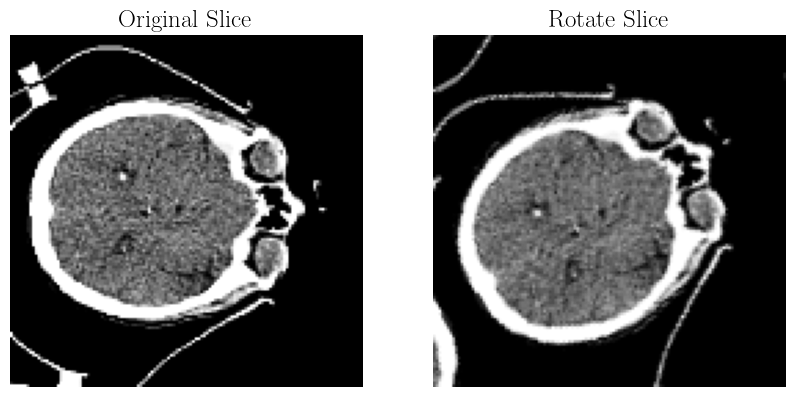

Crop Shape: (128, 128, 64)


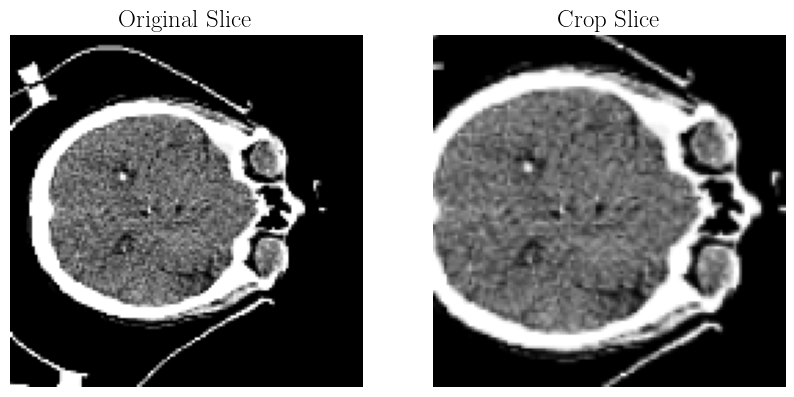

Flip Shape: (128, 128, 64)


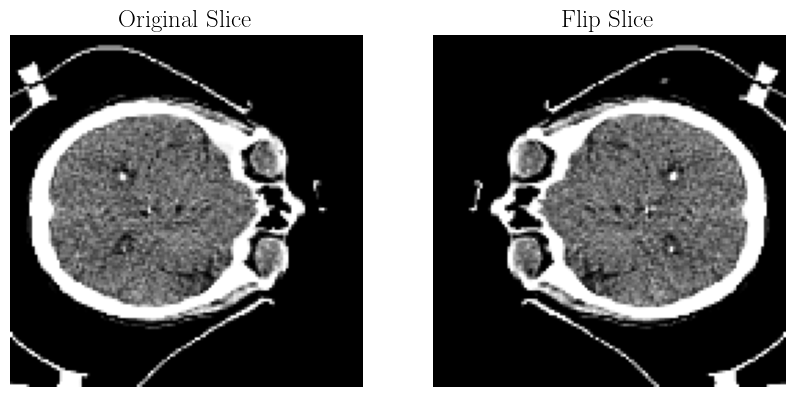

Intensity Shape: (128, 128, 64)


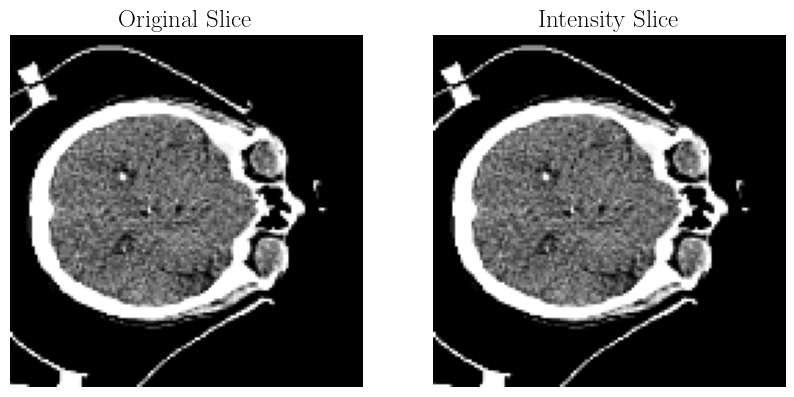

In [13]:
plot.visualize_augmentation(normalized_image, augmented_Rotate, slice_index=32, name='Rotate')
plot.visualize_augmentation(normalized_image, augmented_Crop, slice_index=32, name='Crop')
plot.visualize_augmentation(normalized_image, augmented_Flip, slice_index=32, name='Flip')
plot.visualize_augmentation(normalized_image, augmented_intensity, slice_index=32, name='Intensity')


#### Predict T1w image from CT input

In [14]:
input_list1 = input_list = [bcs.ensure_5d(augmented_Rotate)] * 4
# crop_squeeze = np.squeeze(augmented_Crop)
input_list2 = input_list = [bcs.ensure_5d(augmented_Crop)] * 4
input_list3 = input_list = [bcs.ensure_5d(augmented_Flip)] * 4
input_list4 = input_list = [bcs.ensure_5d(augmented_intensity)] * 4
input_list5 = input_list = [bcs.ensure_5d(input_tensor)] * 4

# Run prediction with all expected inputs
m1 = trained_modelFL.predict(input_list1)
m2 = trained_modelFL.predict(input_list2)
m3 = trained_modelFL.predict(input_list3)
m4 = trained_modelFL.predict(input_list4)
m5 = trained_modelFL.predict(input_list5)

1/1 [==============================] - 51s 51s/step


#### Show the predicted image, Heatmap,Histogram of Pixel difference

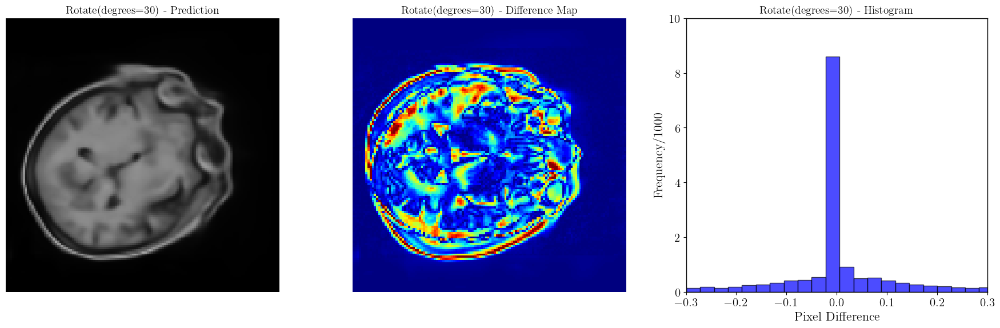

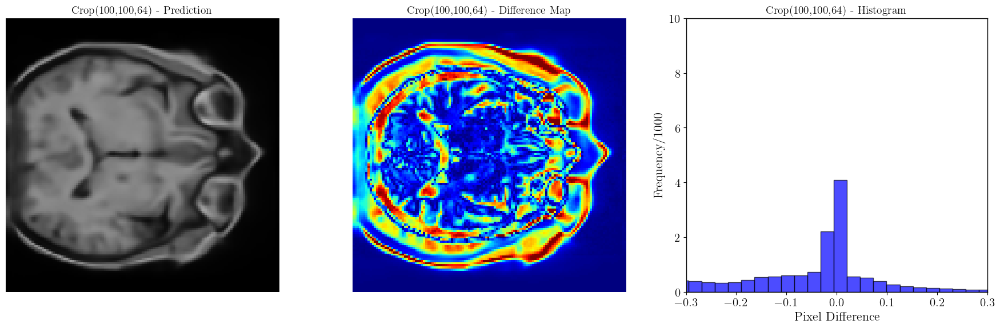

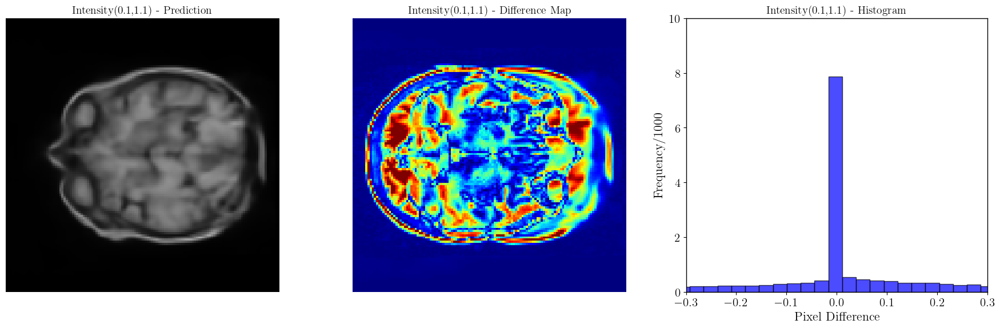

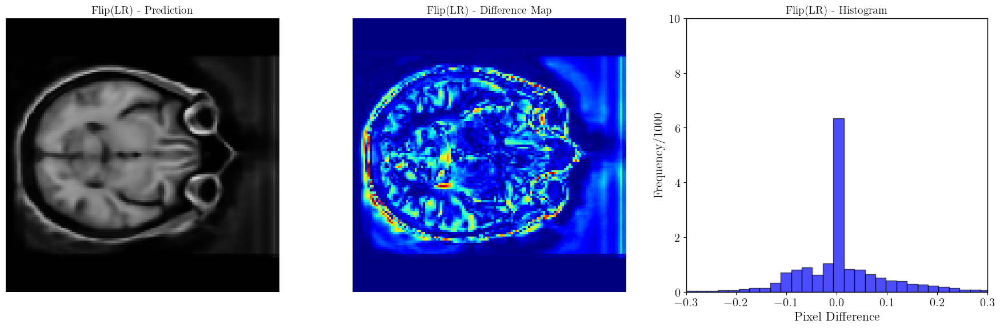

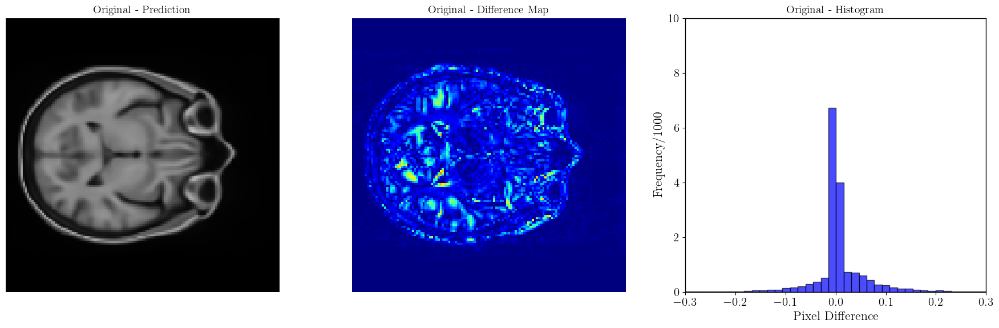

In [15]:
pred_list = [m1, m2, m3, m4, m5]
pred_names = ['Rotate(degrees=30)', 'Crop(100,100,64)', 'Intensity(0.1,1.1)', 'Flip(LR)', 'Original']
plot.visualize_predictions_with_difference(pred_list, pred_names, ground_truth, normalized_image, batch_index=0)


#### Performance evaluation

In [16]:
pred_list = [m1, m2, m3, m4, m5]
pred_names = ['Rotate(degrees=30)', 'Crop(100,100,64)', 'Intensity(0.1,1.1)', 'Flip(LR)', 'Original']

psnr_scores, ssim_scores = utils.compute_psnr_ssim(
    predictions=pred_list,
    prediction_names=pred_names,
    ground_truth=ground_truth,
    original_image=normalized_image,
    batch_index=0,
    save_dir='results/figures',    # Set to None to disable saving
    visualize=False                # Set to True to display plots
)

# Print Summary Table
print("\nSummary of PSNR and SSIM Scores:\n")
print("{:<25} {:<10} {:<10}".format("Prediction", "PSNR", "SSIM"))
print("-" * 45)
for name, p_val, s_val in zip(pred_names, psnr_scores, ssim_scores):
    print("{:<25} {:<10.4f} {:<10.4f}".format(name, p_val, s_val))



Summary of PSNR and SSIM Scores:

Prediction                PSNR       SSIM      
---------------------------------------------
Rotate(degrees=30)        17.1061    0.4737    
Crop(100,100,64)          14.4189    0.2459    
Intensity(0.1,1.1)        14.8699    0.4014    
Flip(LR)                  20.3797    0.6110    
Original                  25.4551    0.8699    


In [17]:
###

#### Display predicted image slices and compute PSNR and SSIM for all predictions using the full validation dataset.

Processing Batches:   0%|                                                                       | 0/10 [00:00<?, ?it/s]

1/1 [==============================] - 50s 50s/step



Batch 0 Samples:   0%|                                                                           | 0/1 [00:00<?, ?it/s]

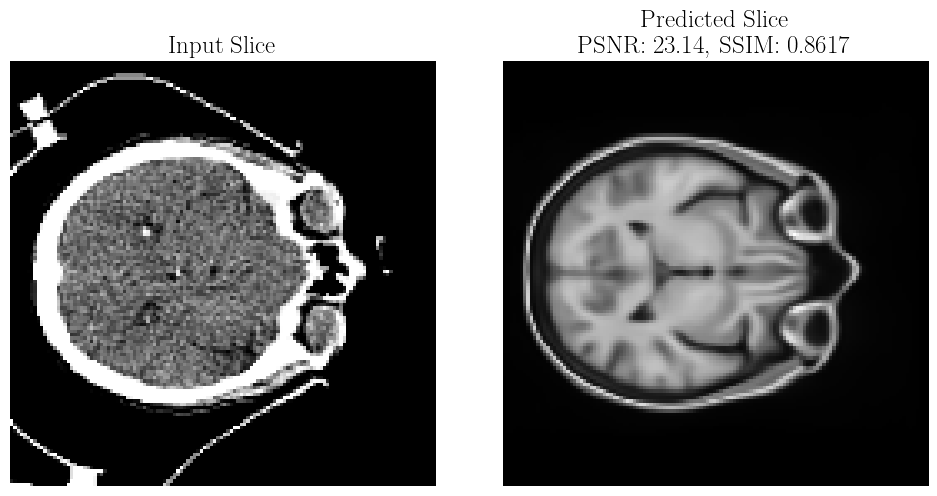


Processing Batches:  10%|██████▎                                                        | 1/10 [00:55<08:17, 55.31s/it]

1/1 [==============================] - 53s 53s/step



Processing Batches:  20%|████████████▌                                                  | 2/10 [01:48<07:12, 54.05s/it]

1/1 [==============================] - 53s 53s/step



Processing Batches:  30%|██████████████████▉                                            | 3/10 [02:41<06:14, 53.55s/it]

1/1 [==============================] - 49s 49s/step



Processing Batches:  40%|█████████████████████████▏                                     | 4/10 [03:30<05:11, 51.91s/it]

1/1 [==============================] - 49s 49s/step



Processing Batches:  50%|███████████████████████████████▌                               | 5/10 [04:19<04:14, 50.83s/it]

1/1 [==============================] - 49s 49s/step



Processing Batches:  60%|█████████████████████████████████████▊                         | 6/10 [05:08<03:20, 50.15s/it]

1/1 [==============================] - 55s 55s/step



Processing Batches:  70%|████████████████████████████████████████████                   | 7/10 [06:03<02:35, 51.68s/it]

1/1 [==============================] - 50s 50s/step



Processing Batches:  80%|██████████████████████████████████████████████████▍            | 8/10 [06:53<01:42, 51.22s/it]

1/1 [==============================] - 50s 50s/step



Processing Batches:  90%|████████████████████████████████████████████████████████▋      | 9/10 [07:43<00:50, 50.73s/it]

1/1 [==============================] - 58s 58s/step



Processing Batches: 100%|██████████████████████████████████████████████████████████████| 10/10 [08:41<00:00, 52.17s/it]


In [18]:

# Evaluate and view only the mid slice
avg_psnr, avg_ssim, psnr_values, ssim_values = plot.visualize_plot(trained_modelFL, val_dataset, visualize=True, view_type='CT_MRI')


In [19]:
print(avg_psnr)
print(avg_ssim)

23.546216107509256
0.8648761819430499


In [20]:
print("PSNR:", psnr_values)
print("SSIM:", ssim_values)

PSNR: [23.137655358466485, 21.172345796396407, 22.559357702876195, 25.443029280729704, 23.623000209053934, 24.243667673647522, 22.30796709207913, 25.145416105949842, 24.077663613960738, 23.752058241932595]
SSIM: [0.8616989427527136, 0.8490974561290922, 0.8589038930228807, 0.8782858781463554, 0.8547100232689667, 0.8826870648110443, 0.8680866298519594, 0.8789880035770594, 0.8537474968722564, 0.862556430998171]


#### Show different slices of the predicted image

Processing Batches:   0%|                                                                       | 0/10 [00:00<?, ?it/s]

1/1 [==============================] - 49s 49s/step



Batch 0 Samples:   0%|                                                                           | 0/1 [00:00<?, ?it/s]

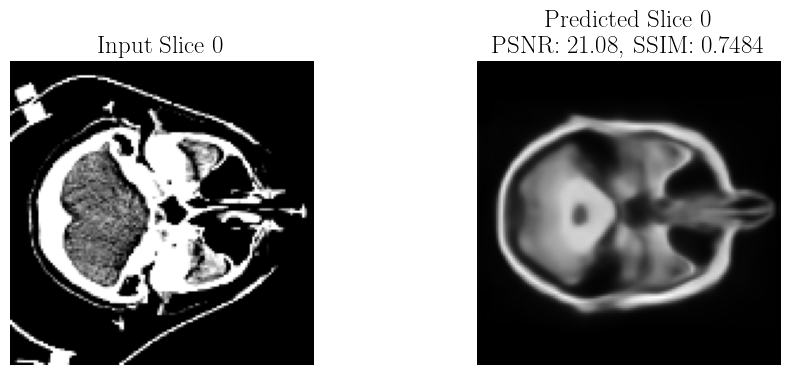

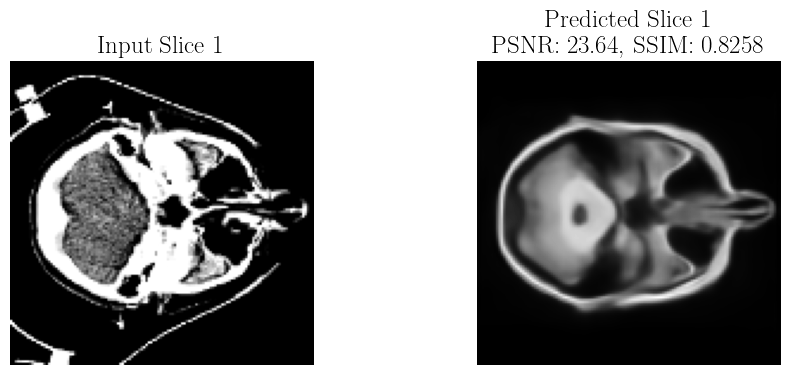

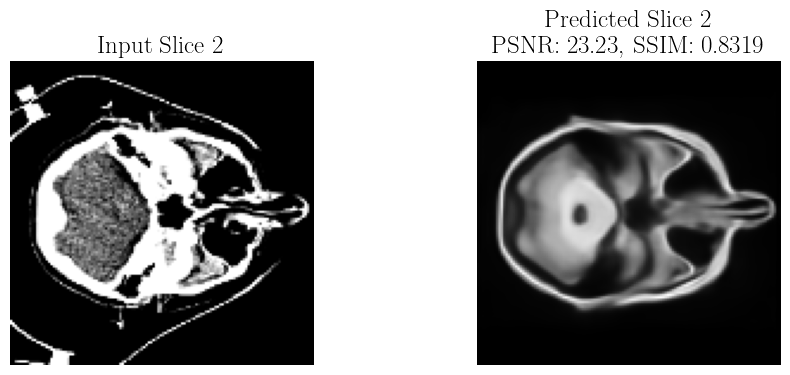

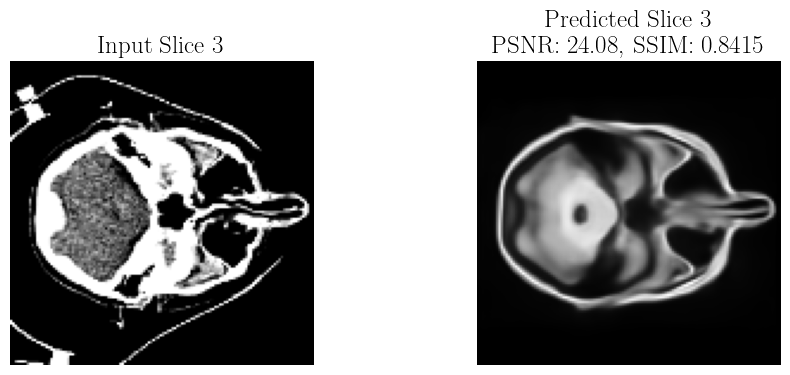

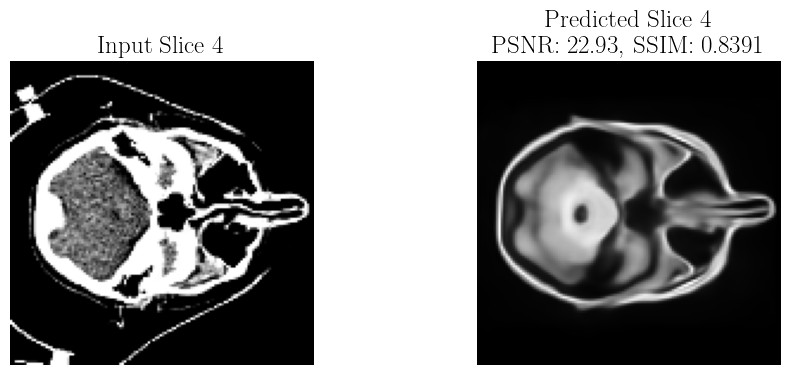

...

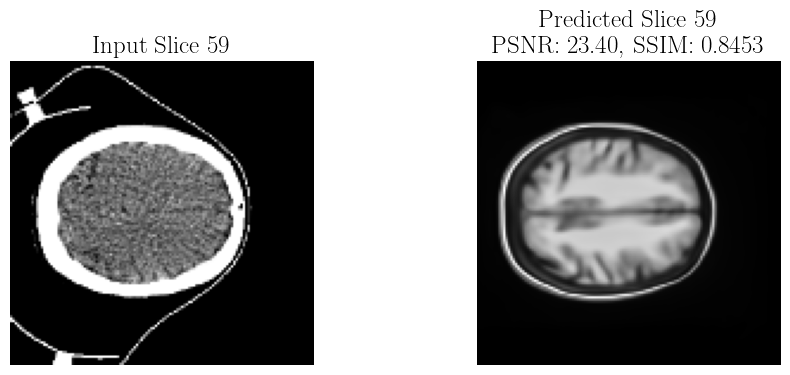

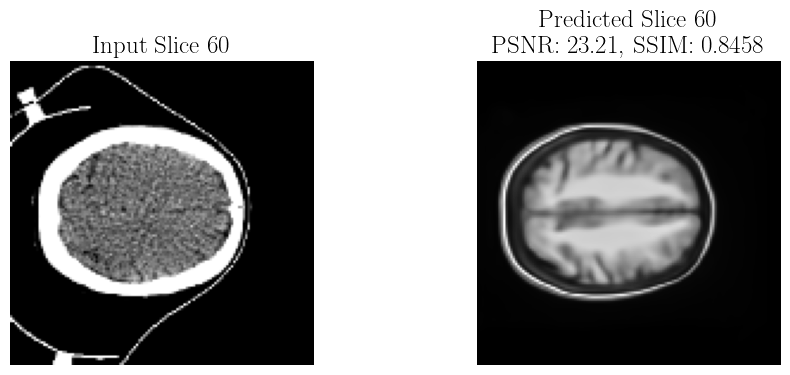

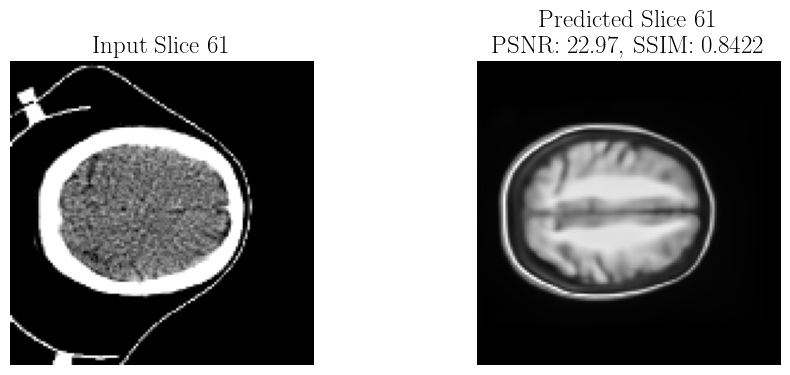

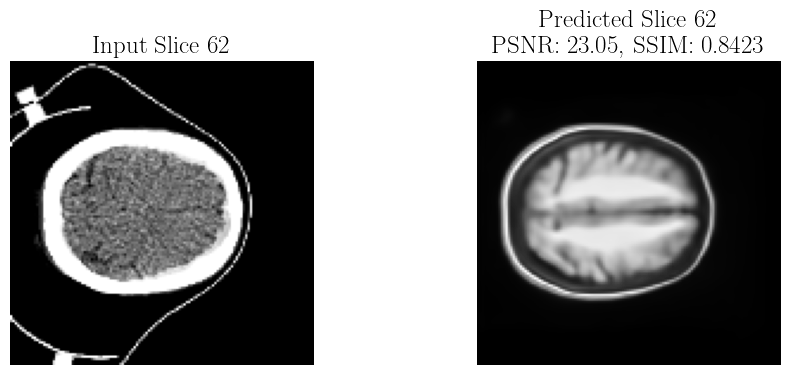

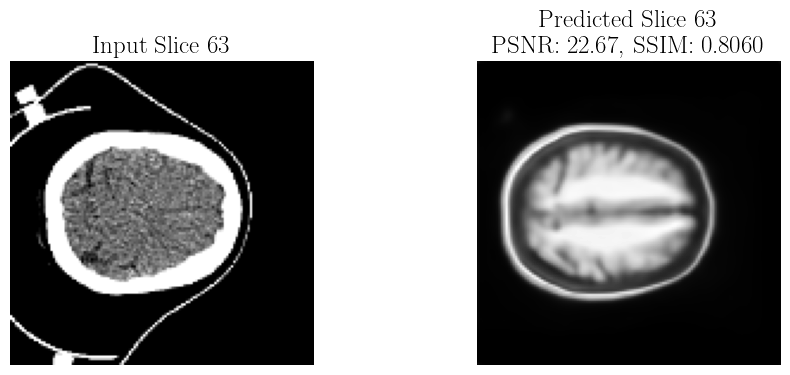


Processing Batches:  10%|██████▎                                                        | 1/10 [01:29<13:28, 89.80s/it]

1/1 [==============================] - 51s 51s/step



Processing Batches:  20%|████████████▌                                                  | 2/10 [02:20<08:54, 66.79s/it]

1/1 [==============================] - 49s 49s/step



Processing Batches:  30%|██████████████████▉                                            | 3/10 [03:10<06:52, 58.93s/it]

1/1 [==============================] - 50s 50s/step



Processing Batches:  40%|█████████████████████████▏                                     | 4/10 [04:00<05:33, 55.56s/it]

1/1 [==============================] - 50s 50s/step



Processing Batches:  50%|███████████████████████████████▌                               | 5/10 [04:51<04:28, 53.77s/it]

1/1 [==============================] - 50s 50s/step



Processing Batches:  60%|█████████████████████████████████████▊                         | 6/10 [05:41<03:29, 52.48s/it]

1/1 [==============================] - 900s 900s/step



Processing Batches:  70%|███████████████████████████████████████████▍                  | 7/10 [20:41<16:29, 329.74s/it]

1/1 [==============================] - 53s 53s/step



Processing Batches:  80%|█████████████████████████████████████████████████▌            | 8/10 [21:34<08:03, 241.66s/it]

1/1 [==============================] - 55s 55s/step



Processing Batches:  90%|███████████████████████████████████████████████████████▊      | 9/10 [22:29<03:03, 183.29s/it]

1/1 [==============================] - 50s 50s/step



Processing Batches: 100%|█████████████████████████████████████████████████████████████| 10/10 [23:20<00:00, 140.01s/it]


In [21]:
# Evaluate and view all slices with PSNR and SSIM per slice
avg_psnr, avg_ssim, psnr_values, ssim_values = plot.visualize_plot(trained_modelFL, val_dataset, visualize=True, view_type='all')


In [23]:
print("Average PSNR:",avg_psnr)
print("Average SSIM:", avg_ssim)
print("PSNR:",psnr_values)
print("SSIM:" ,ssim_values)

Average PSNR: 23.546216107509256
Average SSIM: 0.8648761819430499
PSNR: [23.137655358466485, 21.172345796396407, 22.559357702876195, 25.443029280729704, 23.623000209053934, 24.243667673647522, 22.30796709207913, 25.145416105949842, 24.077663613960738, 23.752058241932595]
SSIM: [0.8616989427527136, 0.8490974561290922, 0.8589038930228807, 0.8782858781463554, 0.8547100232689667, 0.8826870648110443, 0.8680866298519594, 0.8789880035770594, 0.8537474968722564, 0.862556430998171]


#### Performace assessment 

In [24]:
#
val_dataset = utils.create_dataset(VAL_PATHS["input"],VAL_PATHS["target"],target_shape,batch_size)
# model evaluation
avg_psnr, avg_ssim, psnr_values, ssim_values =  utils.assessing_performance(trained_modelFL, val_dataset, input_shape)


Evaluating Batches:  10%|██████▎                                                        | 1/10 [00:53<08:04, 53.86s/it]

First sample PSNR: 25.4551, SSIM: 0.8699



Evaluating Batches: 100%|██████████████████████████████████████████████████████████████| 10/10 [07:27<00:00, 44.77s/it]


Final Average PSNR: 25.4258, SSIM: 0.8720


In [25]:
print("Average PSNR:",avg_psnr)
print("Average SSIM:", avg_ssim)
print("PSNR:",psnr_values)
print("SSIM:" ,ssim_values)

Average PSNR: 25.425770847952624
Average SSIM: 0.8720317309244725
PSNR: [25.45512097693523, 22.252446772192904, 24.674252477480533, 27.209410263428772, 25.66308737919499, 26.100082929696505, 24.956940839000975, 27.2452940360398, 25.30566569307929, 25.39540711247724]
SSIM: [0.8699037203253842, 0.8524231742389379, 0.8671169353078864, 0.8856501293732486, 0.8630332811975892, 0.8891369321365313, 0.8763136253959236, 0.8874313873429907, 0.8594555148849639, 0.8698526090412714]
